In [1]:
yes_folders = [
    '25-09-29-1238_setting0',
    '25-09-30-1142_setting0',
    '25-09-30-1338_setting0',
    '25-09-30-1427_setting0',
    '25-09-30-1530_setting0',
    '25-10-01-1417_setting0',
    '25-10-07-1233_setting0',  # yes, maybe no
    '25-10-07-1328_setting0',  # yes?
    '25-10-07-1513_setting0',
    '25-10-09-1303_setting0',
    '25-10-17-1206_setting0',
    '25-10-20-1204_setting0',
    '25-10-20-1257_setting0',
    '25-10-21-1446_setting0',
    '25-10-22-1358_setting0',
    '25-10-23-1258_setting0',  # yes, maybe no
    '25-10-24-1302_setting0',
    '25-10-27-1254_setting0',
    '25-10-30-1254_setting0',
    '25-10-31-1350_setting0',
    '25-11-03-1100_setting0',  # yes?
    '25-11-03-1151_setting0',
    '25-11-03-1301_setting0',  # yes?
    '25-11-04-1214_setting0',
    '25-11-04-1404_setting0',  # yes?
    '25-11-05-1407_setting0',
    '25-11-05-1457_setting0',
    '25-11-06-1302_setting0',  # yes?
    '25-11-07-1401_setting0',
    '25-11-07-1456_setting0',
]


In [2]:
import numpy as np
import os
import matplotlib.pyplot as plt
import math
import pandas as pd

from check_qualities import CheckQuality

In [4]:
rt_list = []
incorrect_count_list = []

for i in folders:
    test = CheckQuality(i) 
    rt_list.append(test.rt_mean)
    incorrect_count_list.append(test.incorrect_count)


/scratch/yd2103/pd_data/check_qualities.py:57: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  self.eye_raw = pd.read_csv(self.eye_data_path)


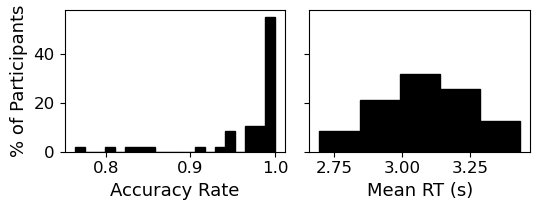

In [7]:
import numpy as np
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(5.5, 2.2), sharey=True)

# Make bars black
bar_color = "black"

# Transform incorrect counts to accuracy rate
accuracy_rate_list = [(270 - x)/270 for x in incorrect_count_list]

# Accuracy rate (% of participants)
weights_acc = np.ones(len(accuracy_rate_list)) / len(accuracy_rate_list) * 100
axes[0].hist(accuracy_rate_list, bins=20, weights=weights_acc,
             color=bar_color, edgecolor="black")
axes[0].set_xlabel("Accuracy Rate", fontsize=13)
axes[0].set_ylabel("% of Participants", fontsize=13)
axes[0].tick_params(axis='both', labelsize=12)

# Mean RT (% of participants)
weights_rt = np.ones(len(rt_list)) / len(rt_list) * 100
axes[1].hist(rt_list, bins=5, weights=weights_rt,
             color=bar_color, edgecolor="black")
axes[1].set_xlabel("Mean RT (s)", fontsize=13)
axes[1].set_ylabel("")  # remove right y-label
axes[1].tick_params(axis='both', labelsize=12)

plt.tight_layout()
# plt.suptitle("Performance Accuracy and Reaction Time Across Participants", fontsize=16, y=1.05)
# Save as PDF (vector graphic, best for LaTeX)
# plt.savefig("accuracy_rt_plot.pdf", bbox_inches='tight')
plt.show()


In [10]:
percentage_below_095 = (
    sum(acc <= 0.9 for acc in accuracy_rate_list) / len(accuracy_rate_list)
) * 100


In [13]:
np.mean(accuracy_rate_list)


np.float64(0.9641449960598896)

In [7]:
os.getcwd()

'/Users/labadmin/pd_data'

In [14]:
import os
import shutil

parent_folder = "/Users/labadmin/pd_data/data/processed/v1/eyetracking"

for folder_name in os.listdir(parent_folder):
    folder_path = os.path.join(parent_folder, folder_name)
    
    if os.path.isdir(folder_path):
        # Create backup folder
        backup_folder = os.path.join(folder_path, "to_delete")
        os.makedirs(backup_folder, exist_ok=True)
        
        for item in os.listdir(folder_path):
            item_path = os.path.join(folder_path, item)
            
            # Skip 'all.csv' and the backup folder itself
            if item != "all.csv" and item != "to_delete":
                shutil.move(item_path, os.path.join(backup_folder, item))
                print(f"Moved {item_path} to {backup_folder}")


Moved /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-24-1302_setting0/samples_8.csv to /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-24-1302_setting0/to_delete
Moved /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-24-1302_setting0/samples_3.csv to /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-24-1302_setting0/to_delete
Moved /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-24-1302_setting0/samples_2.csv to /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-24-1302_setting0/to_delete
Moved /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-24-1302_setting0/samples_0.csv to /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-24-1302_setting0/to_delete
Moved /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-24-1302_setting0/samples_1.csv to /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-24-1302_setting0/to_delete
Moved /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10

In [15]:


parent_folder = "/Users/labadmin/pd_data/data/processed/v1/eyetracking"

for folder_name in os.listdir(parent_folder):
    folder_path = os.path.join(parent_folder, folder_name)
    
    if os.path.isdir(folder_path):
        backup_folder = os.path.join(folder_path, "to_delete")
        
        # Check if backup folder exists, then delete it
        if os.path.exists(backup_folder) and os.path.isdir(backup_folder):
            shutil.rmtree(backup_folder)
            print(f"Deleted folder: {backup_folder}")


Deleted folder: /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-17-1206_setting0/to_delete
Deleted folder: /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-24-1302_setting0/to_delete
Deleted folder: /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-01-1458_setting0/to_delete
Deleted folder: /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-11-03-1151_setting0/to_delete
Deleted folder: /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-30-1254_setting0/to_delete
Deleted folder: /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-27-1254_setting0/to_delete
Deleted folder: /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-17-1258_setting0/to_delete
Deleted folder: /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-10-07-1233_setting0/to_delete
Deleted folder: /Users/labadmin/pd_data/data/processed/v1/eyetracking/.DS_Store/to_delete
Deleted folder: /Users/labadmin/pd_data/data/processed/v1/eyetracking/25-09-30-1236_se

In [3]:
# we want these

excluded_folders = [
'25-10-24-1302_setting0',
'25-10-30-1254_setting0',
'25-10-22-1358_setting0',
'25-09-30-1530_setting0',
'25-10-01-1417_setting0',
'25-09-30-1427_setting0',
'25-10-20-1204_setting0',
'25-10-07-1513_setting0',
'25-10-21-1446_setting0',
'25-10-27-1205_setting0'
]


In [3]:
directory = "data/processed/v1/eyetracking"
excluded_folders = []
# excluded_folders = ['25-11-14-1255_setting0', '25-11-11-1259_setting0']
folders = [f for f in os.listdir(directory) if f not in excluded_folders and f != ".DS_Store"]


In [4]:
len(folders)

47

In [5]:
len(folders)

8

25-11-14-1455_setting0
file name: 25-11-14-1455_setting0
Incorrect count: 3
Incorrect trial list: [ 51 112 263]
Number of incorrect trials per block:
(0.1, 0.9), 0 incorrect trials
(0.7, 0.5), 1 incorrect trials
(0.9, 0.1), 0 incorrect trials
(0.1, 0.7), 1 incorrect trials
(0.9, 0.3), 0 incorrect trials
(0.5, 0.5), 0 incorrect trials
(0.3, 0.5), 0 incorrect trials
(0.3, 0.7), 0 incorrect trials
(0.7, 0.3), 1 incorrect trials


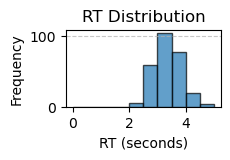

file name: 25-11-14-1455_setting0


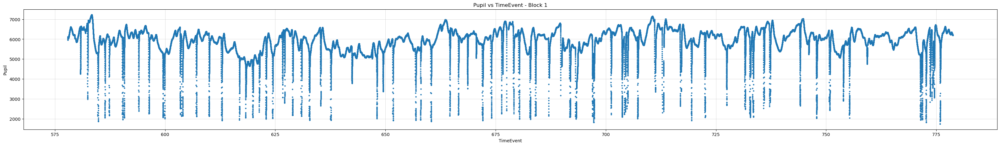

file name: 25-11-14-1455_setting0


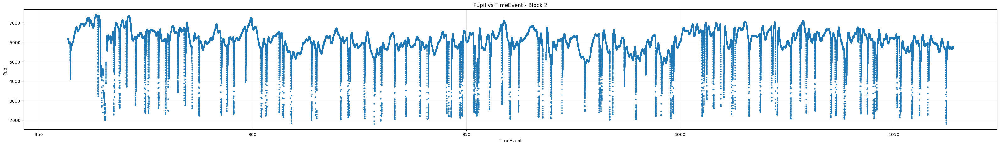

file name: 25-11-14-1455_setting0


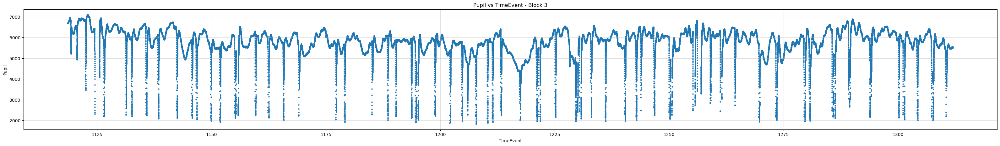

file name: 25-11-14-1455_setting0


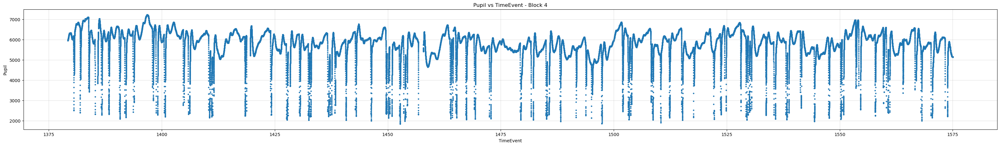

file name: 25-11-14-1455_setting0


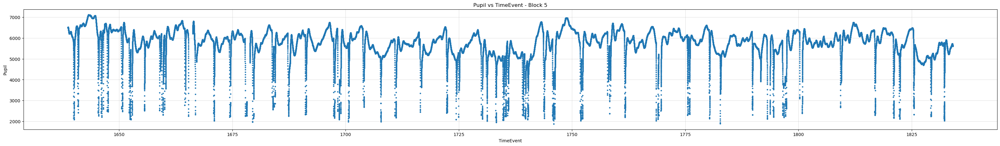

file name: 25-11-14-1455_setting0


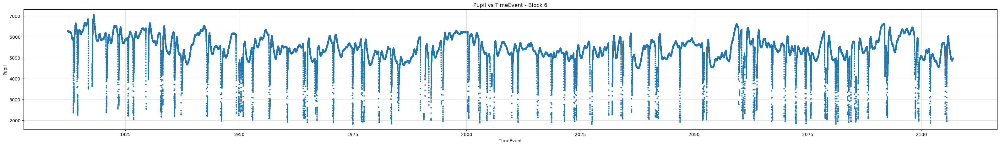

file name: 25-11-14-1455_setting0


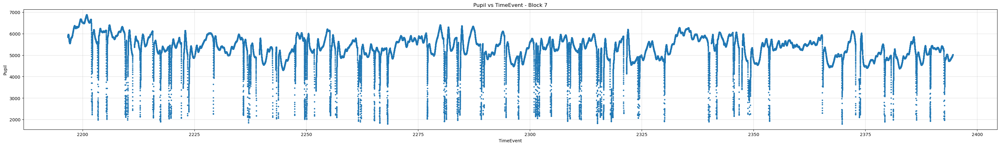

file name: 25-11-14-1455_setting0


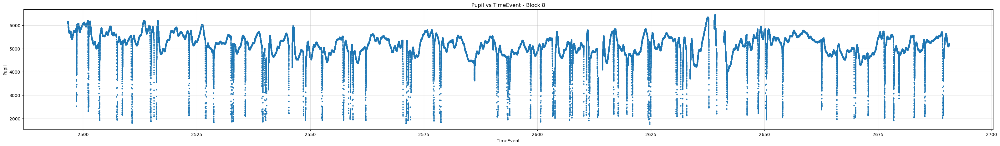

file name: 25-11-14-1455_setting0


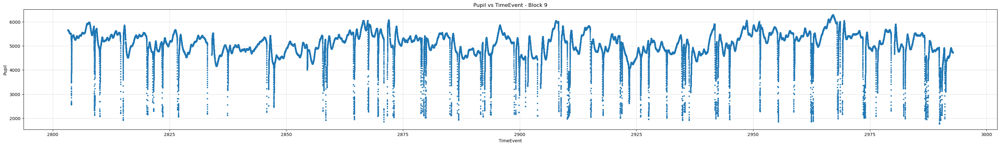

25-11-14-1354_setting0
file name: 25-11-14-1354_setting0
Incorrect count: 4
Incorrect trial list: [  1  48 154 224]
Number of incorrect trials per block:
(0.9, 0.5), 1 incorrect trials
(0.1, 0.5), 1 incorrect trials
(0.3, 0.9), 0 incorrect trials
(0.5, 0.1), 0 incorrect trials
(0.7, 0.1), 0 incorrect trials
(0.5, 0.5), 1 incorrect trials
(0.9, 0.3), 0 incorrect trials
(0.1, 0.7), 1 incorrect trials
(0.5, 0.9), 0 incorrect trials


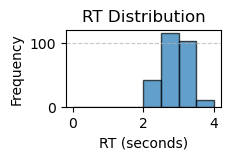

file name: 25-11-14-1354_setting0


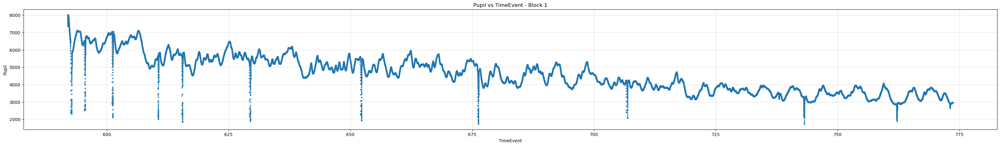

file name: 25-11-14-1354_setting0


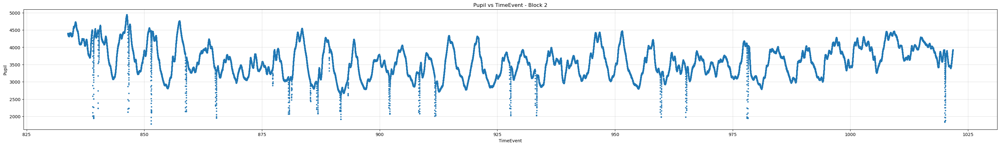

file name: 25-11-14-1354_setting0


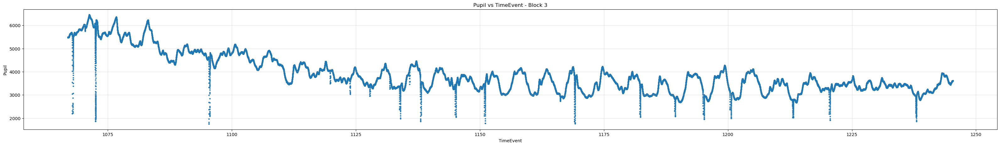

file name: 25-11-14-1354_setting0


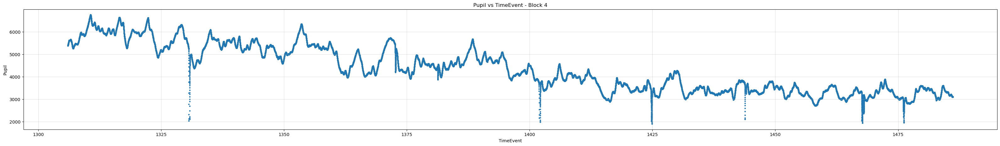

file name: 25-11-14-1354_setting0


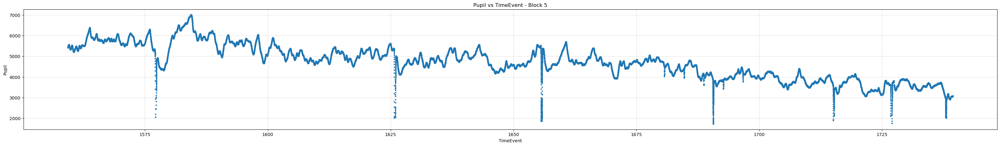

file name: 25-11-14-1354_setting0


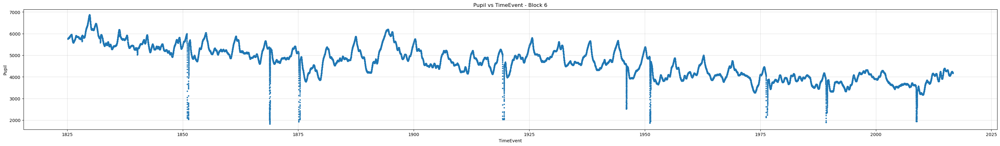

file name: 25-11-14-1354_setting0


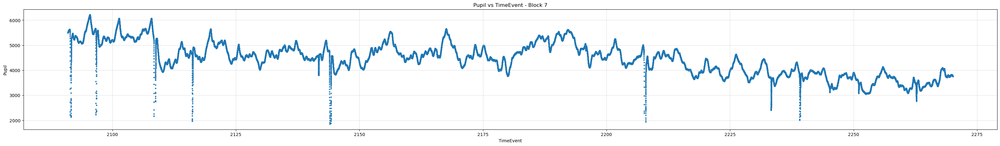

file name: 25-11-14-1354_setting0


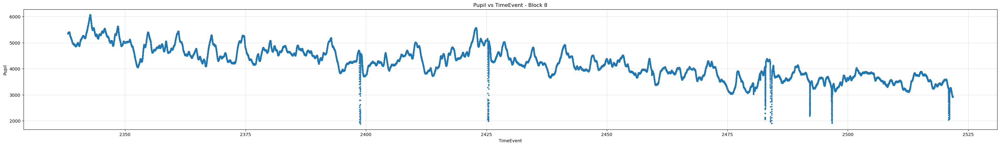

file name: 25-11-14-1354_setting0


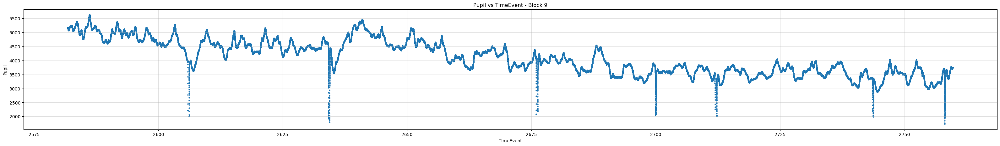

25-11-18-1258_setting0
file name: 25-11-18-1258_setting0
Incorrect count: 1
Incorrect trial list: [14]
Number of incorrect trials per block:
(0.5, 0.5), 1 incorrect trials
(0.1, 0.7), 0 incorrect trials
(0.3, 0.5), 0 incorrect trials
(0.9, 0.9), 0 incorrect trials
(0.9, 0.3), 0 incorrect trials
(0.5, 0.3), 0 incorrect trials
(0.5, 0.7), 0 incorrect trials
(0.1, 0.1), 0 incorrect trials
(0.7, 0.5), 0 incorrect trials


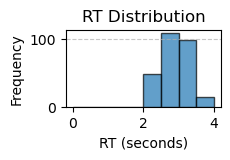

file name: 25-11-18-1258_setting0


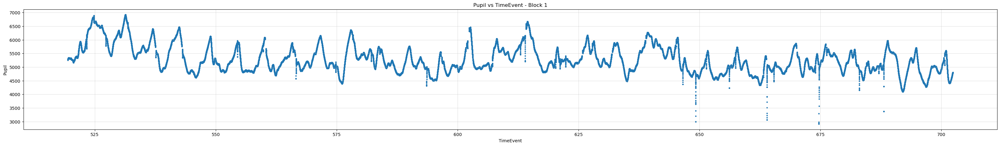

file name: 25-11-18-1258_setting0


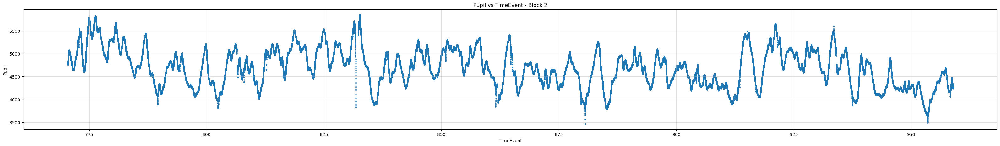

file name: 25-11-18-1258_setting0


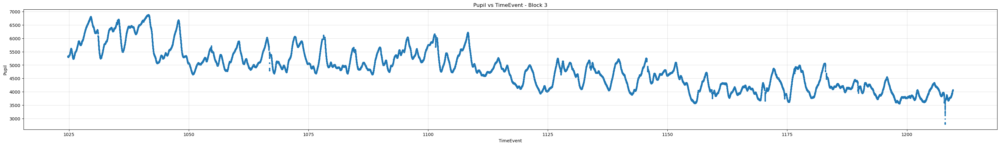

file name: 25-11-18-1258_setting0


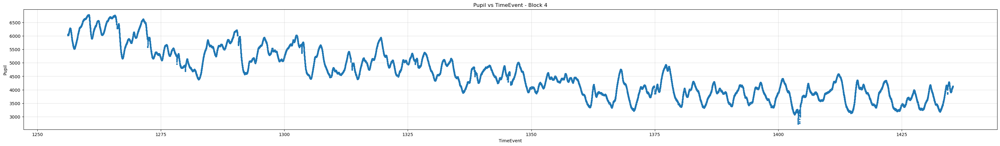

file name: 25-11-18-1258_setting0


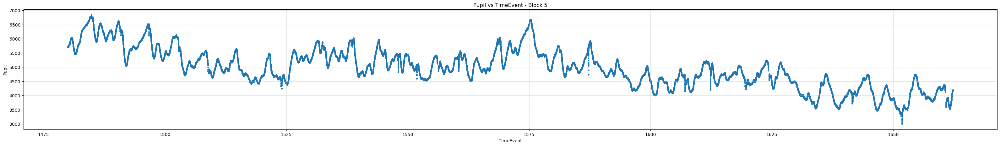

file name: 25-11-18-1258_setting0


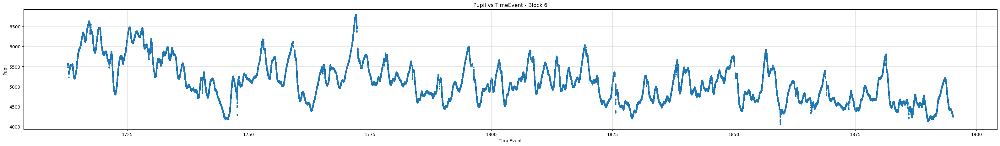

file name: 25-11-18-1258_setting0


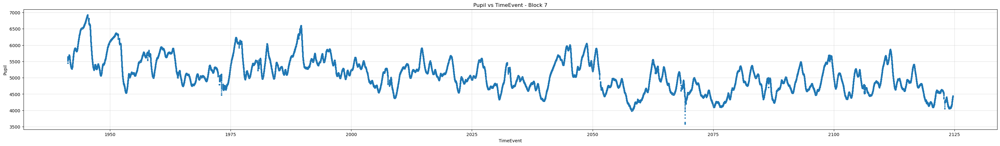

file name: 25-11-18-1258_setting0


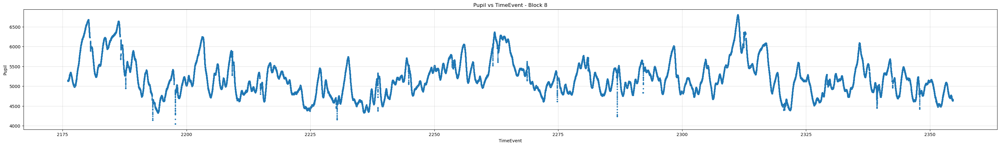

file name: 25-11-18-1258_setting0


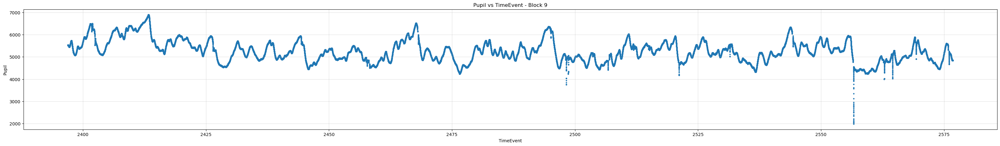

25-11-11-1358_setting0
file name: 25-11-11-1358_setting0
Incorrect count: 6
Incorrect trial list: [139 197 203 235 246 270]
Number of incorrect trials per block:
(0.1, 0.3), 0 incorrect trials
(0.5, 0.9), 0 incorrect trials
(0.7, 0.7), 0 incorrect trials
(0.3, 0.3), 0 incorrect trials
(0.9, 0.7), 1 incorrect trials
(0.9, 0.9), 0 incorrect trials
(0.5, 0.1), 2 incorrect trials
(0.1, 0.1), 1 incorrect trials
(0.5, 0.5), 1 incorrect trials


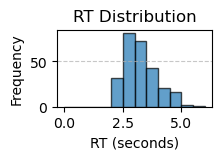

file name: 25-11-11-1358_setting0


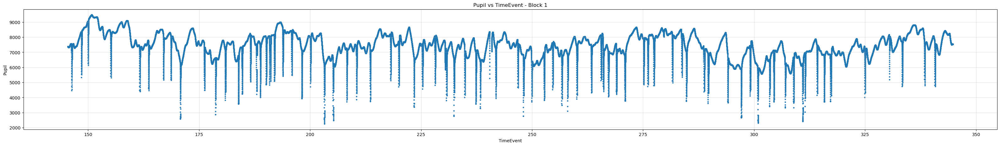

file name: 25-11-11-1358_setting0


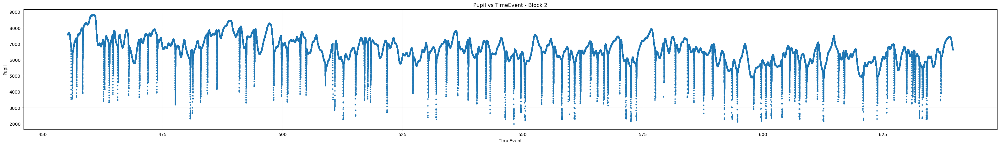

file name: 25-11-11-1358_setting0


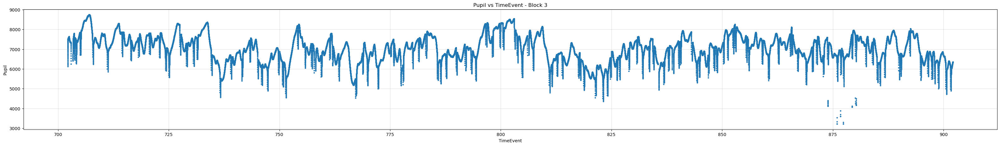

file name: 25-11-11-1358_setting0


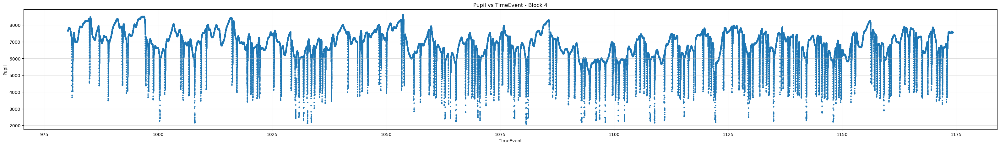

file name: 25-11-11-1358_setting0


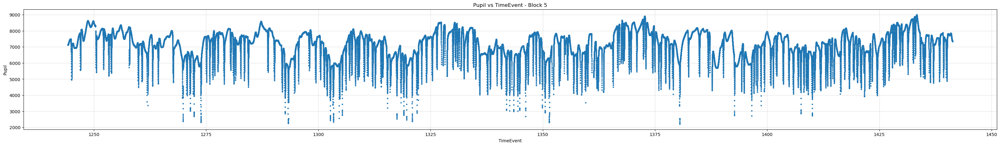

file name: 25-11-11-1358_setting0


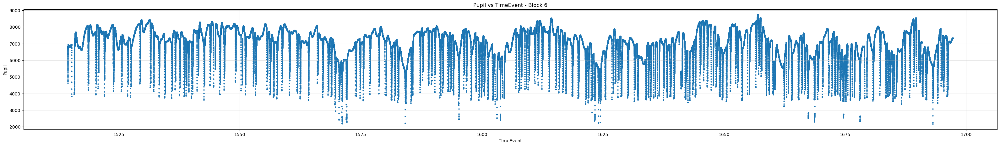

file name: 25-11-11-1358_setting0


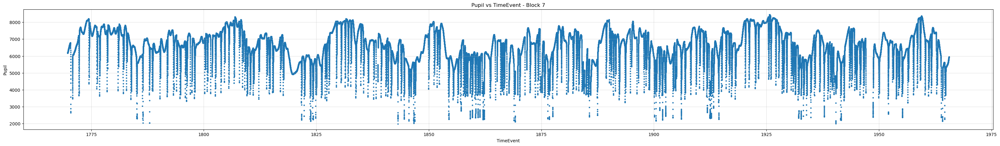

file name: 25-11-11-1358_setting0


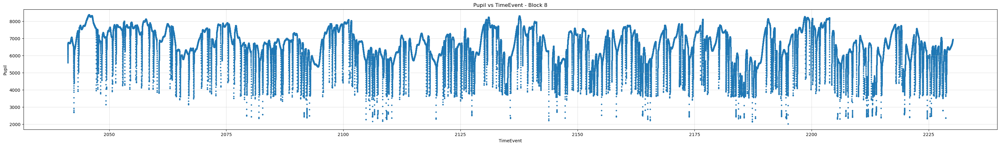

file name: 25-11-11-1358_setting0


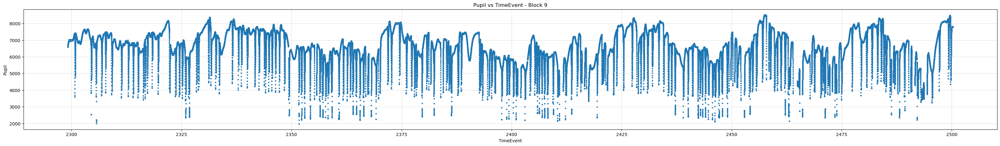

25-11-18-1456_setting0
file name: 25-11-18-1456_setting0
Incorrect count: 14
Incorrect trial list: [  3   5   8  17  27  54  61  63  80 135 175 189 202 254]
Number of incorrect trials per block:
(0.5, 0.5), 5 incorrect trials
(0.9, 0.9), 1 incorrect trials
(0.3, 0.5), 3 incorrect trials
(0.9, 0.9), 0 incorrect trials
(0.7, 0.5), 1 incorrect trials
(0.1, 0.1), 1 incorrect trials
(0.5, 0.7), 2 incorrect trials
(0.1, 0.1), 0 incorrect trials
(0.5, 0.3), 1 incorrect trials


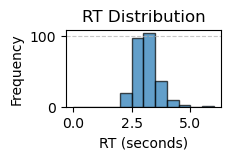

file name: 25-11-18-1456_setting0


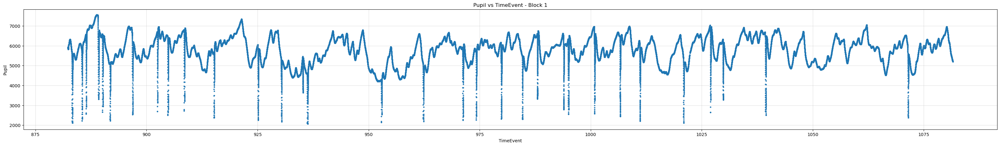

file name: 25-11-18-1456_setting0


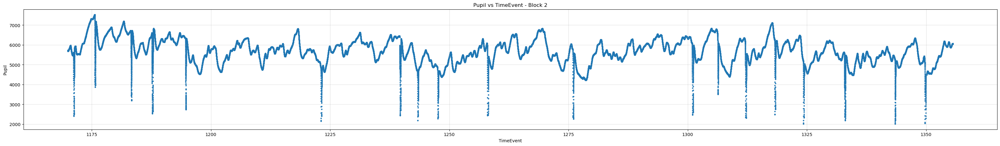

file name: 25-11-18-1456_setting0


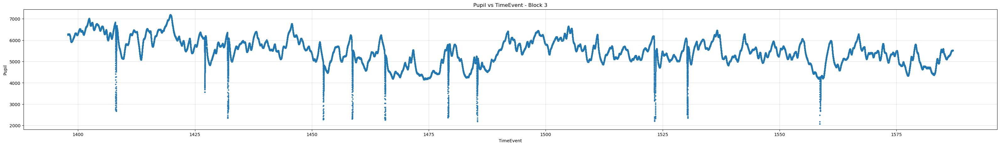

file name: 25-11-18-1456_setting0


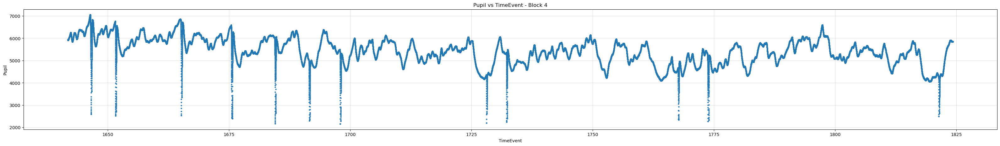

file name: 25-11-18-1456_setting0


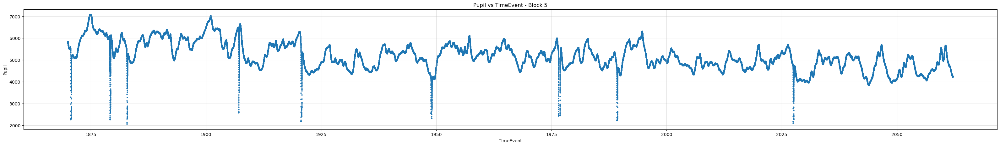

file name: 25-11-18-1456_setting0


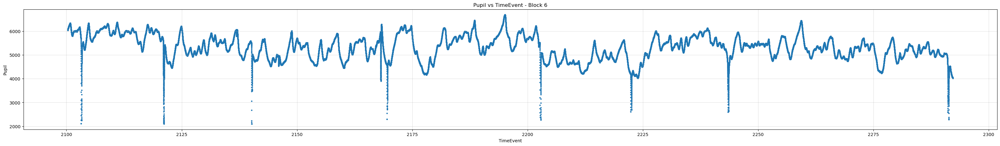

file name: 25-11-18-1456_setting0


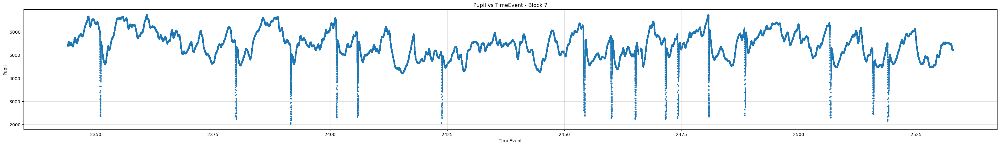

file name: 25-11-18-1456_setting0


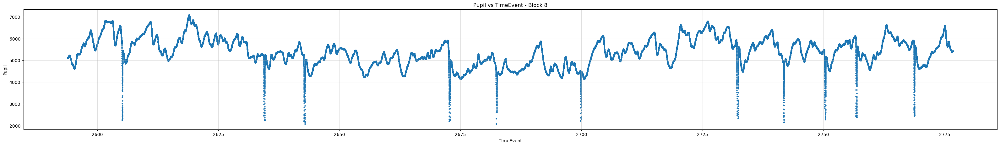

file name: 25-11-18-1456_setting0


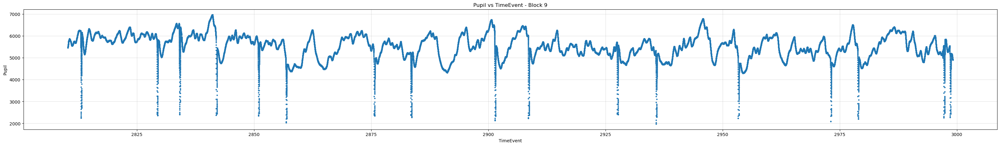

25-11-13-1307_setting0
file name: 25-11-13-1307_setting0
Incorrect count: 0
Incorrect trial list: []
Number of incorrect trials per block:
(0.3, 0.7), 0 incorrect trials
(0.5, 0.9), 0 incorrect trials
(0.7, 0.1), 0 incorrect trials
(0.3, 0.9), 0 incorrect trials
(0.1, 0.5), 0 incorrect trials
(0.9, 0.5), 0 incorrect trials
(0.5, 0.5), 0 incorrect trials
(0.5, 0.1), 0 incorrect trials
(0.7, 0.3), 0 incorrect trials


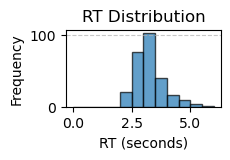

file name: 25-11-13-1307_setting0


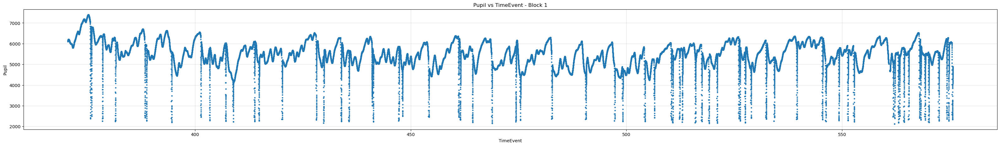

file name: 25-11-13-1307_setting0


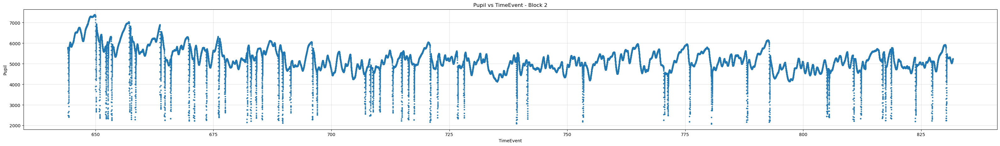

file name: 25-11-13-1307_setting0


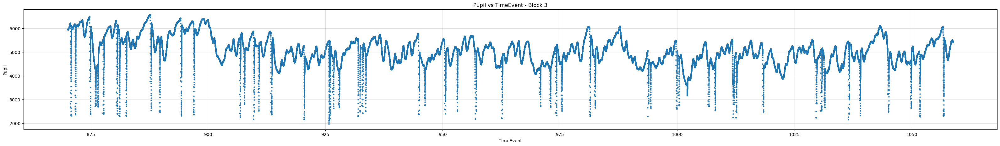

file name: 25-11-13-1307_setting0


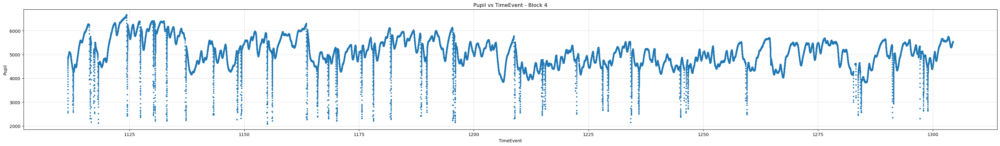

file name: 25-11-13-1307_setting0


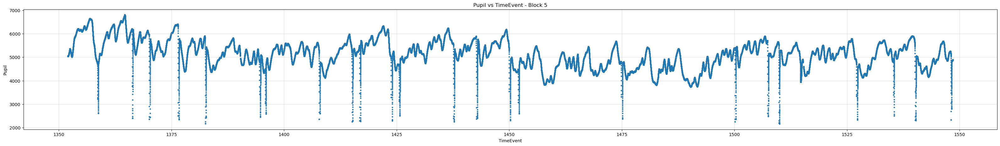

file name: 25-11-13-1307_setting0


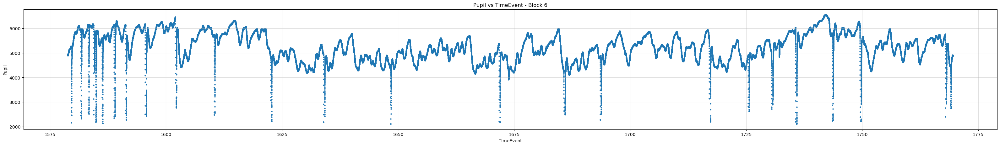

file name: 25-11-13-1307_setting0


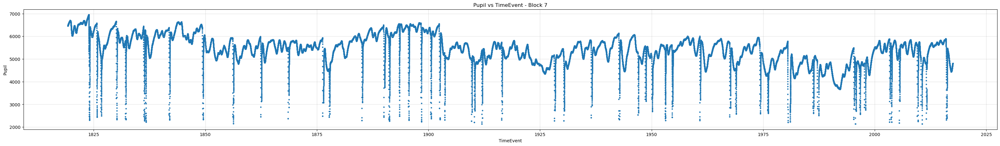

file name: 25-11-13-1307_setting0


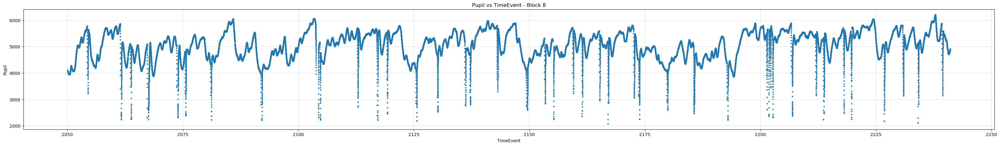

file name: 25-11-13-1307_setting0


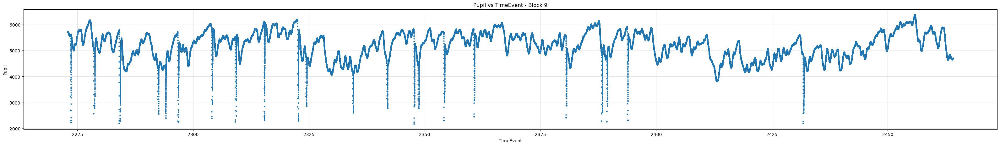

25-11-18-1213_setting0
file name: 25-11-18-1213_setting0
Incorrect count: 4
Incorrect trial list: [181 202 207 253]
Number of incorrect trials per block:
(0.9, 0.3), 0 incorrect trials
(0.7, 0.3), 0 incorrect trials
(0.3, 0.7), 0 incorrect trials
(0.7, 0.5), 0 incorrect trials
(0.5, 0.9), 0 incorrect trials
(0.1, 0.7), 0 incorrect trials
(0.5, 0.1), 3 incorrect trials
(0.5, 0.5), 0 incorrect trials
(0.3, 0.5), 1 incorrect trials


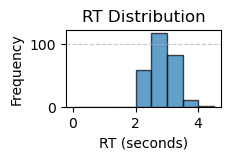

file name: 25-11-18-1213_setting0


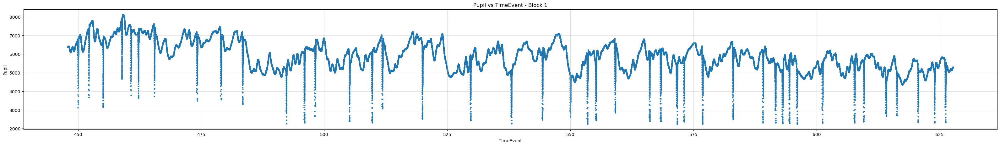

file name: 25-11-18-1213_setting0


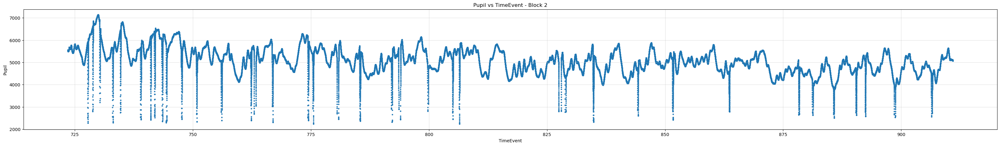

file name: 25-11-18-1213_setting0


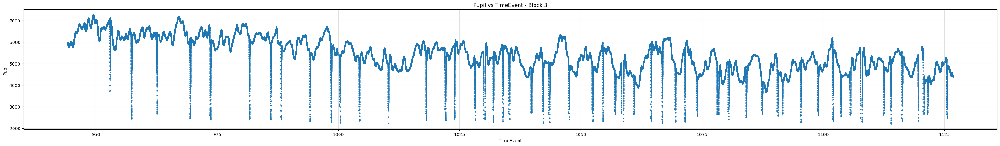

file name: 25-11-18-1213_setting0


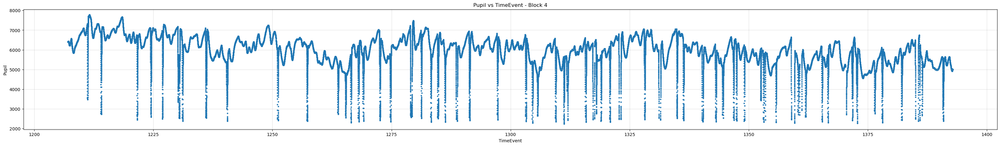

file name: 25-11-18-1213_setting0


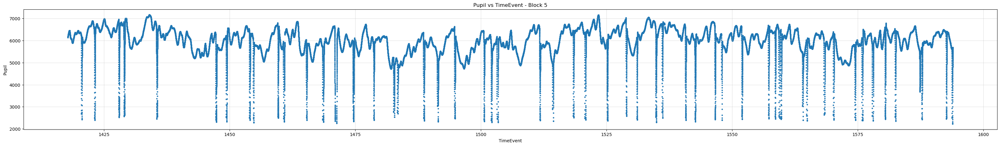

file name: 25-11-18-1213_setting0


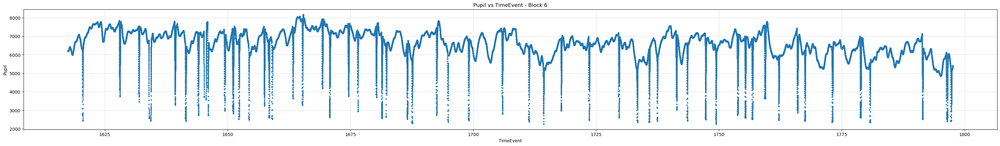

file name: 25-11-18-1213_setting0


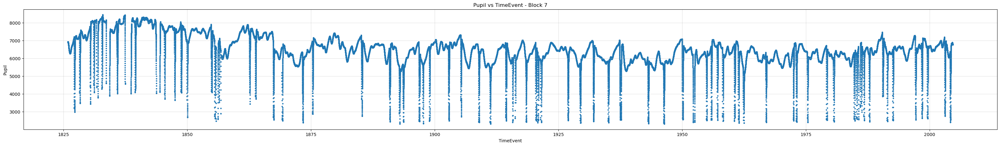

file name: 25-11-18-1213_setting0


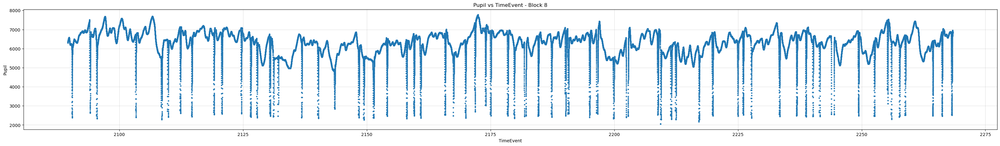

file name: 25-11-18-1213_setting0


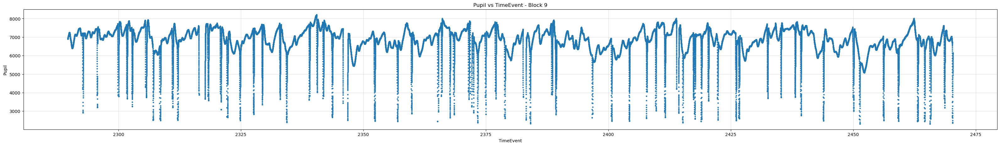

25-11-13-1214_setting0
file name: 25-11-13-1214_setting0
Incorrect count: 3
Incorrect trial list: [ 75  76 165]
Number of incorrect trials per block:
(0.7, 0.3), 0 incorrect trials
(0.3, 0.9), 0 incorrect trials
(0.7, 0.1), 2 incorrect trials
(0.1, 0.3), 0 incorrect trials
(0.9, 0.7), 0 incorrect trials
(0.5, 0.5), 1 incorrect trials
(0.1, 0.1), 0 incorrect trials
(0.9, 0.9), 0 incorrect trials
(0.3, 0.7), 0 incorrect trials


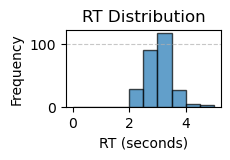

file name: 25-11-13-1214_setting0


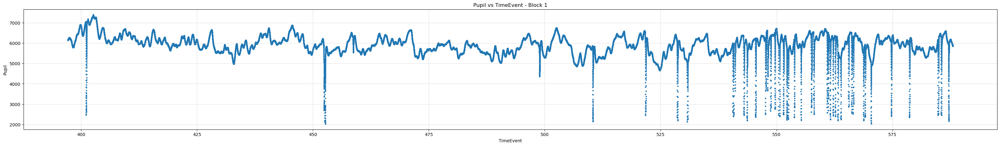

file name: 25-11-13-1214_setting0


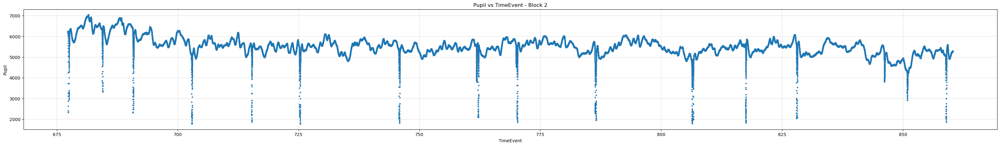

file name: 25-11-13-1214_setting0


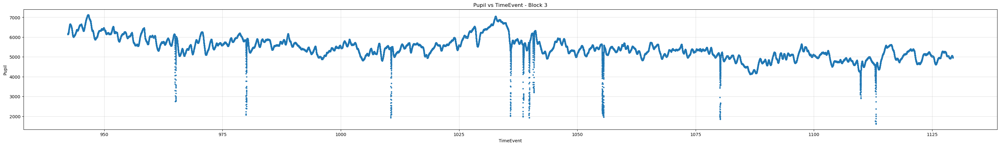

file name: 25-11-13-1214_setting0


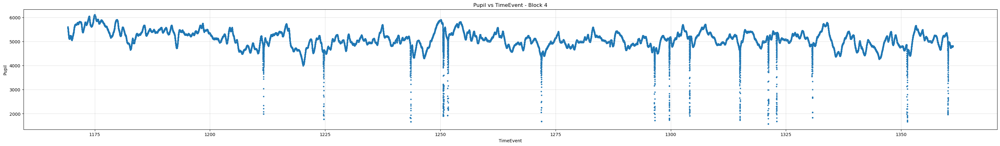

file name: 25-11-13-1214_setting0


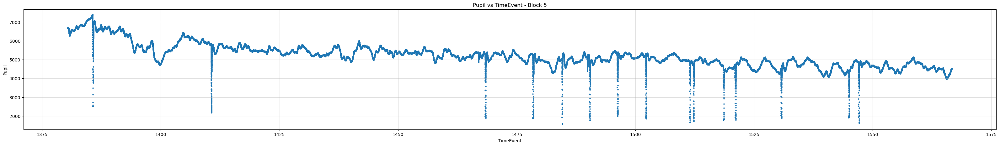

file name: 25-11-13-1214_setting0


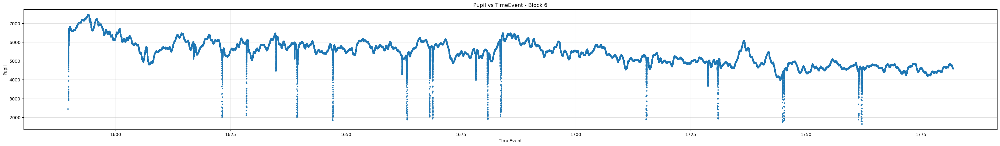

file name: 25-11-13-1214_setting0


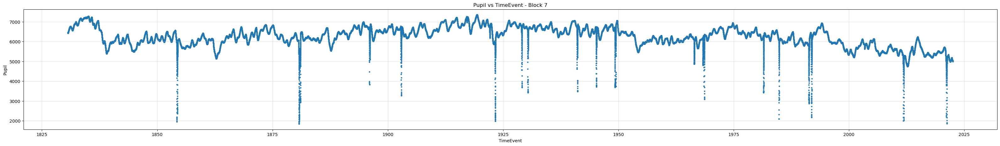

file name: 25-11-13-1214_setting0


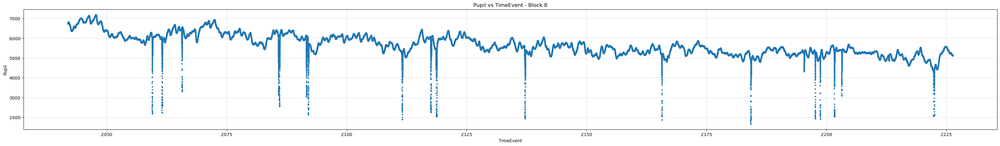

file name: 25-11-13-1214_setting0


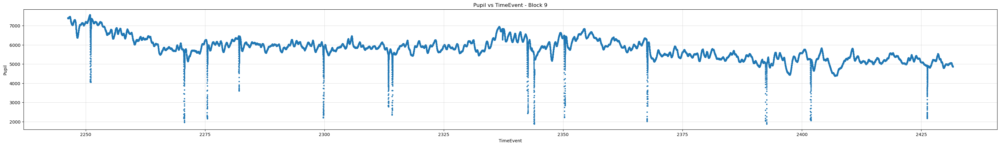

In [6]:
for i in folders:
    print(i)
    test = CheckQuality(i) 
    test.show_performance()  
    test.plot_pupil_per_block()
        

In [ ]:
log

file name: 25-09-29-1238_setting0
Incorrect count: 13
Incorrect trial list: [  1  19  31  33  36  52  91 110 113 120 152 211 227]
Number of incorrect trials per block:
(0.5, 0.7), 2 incorrect trials
(0.5, 0.5), 4 incorrect trials
(0.3, 0.7), 0 incorrect trials
(0.7, 0.3), 3 incorrect trials
(0.5, 0.3), 1 incorrect trials
(0.9, 0.5), 1 incorrect trials
(0.1, 0.9), 0 incorrect trials
(0.1, 0.5), 2 incorrect trials
(0.9, 0.1), 0 incorrect trials


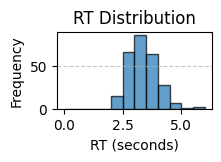

In [131]:
test.show_performance()

In [ ]:
import matplotlib.pyplot as plt

In [60]:
test.log_data

,cue_direction,stimulus,correct_response,left_cue_condition,stimA_condition,response,performance,rt,events,trial_index,wid,block_index,trial_index_within_block
0,left,B|A,j,0.5,0.7,f,Incorrect,4.442101,"[{'time': 278.24222804169403, 'event': 'initia...",1,25-09-29-1238_setting0,1,1
1,right,A|A,f,0.5,0.7,f,Correct,4.513865,"[{'time': 285.85862670838833, 'event': 'initia...",2,25-09-29-1238_setting0,1,2
2,right,B|B,j,0.5,0.7,j,Correct,4.381348,"[{'time': 293.5529617916909, 'event': 'initial...",3,25-09-29-1238_setting0,1,3
3,right,A|A,f,0.5,0.7,f,Correct,4.563732,"[{'time': 301.09968120837584, 'event': 'initia...",4,25-09-29-1238_setting0,1,4
4,right,A|A,f,0.5,0.7,f,Correct,4.336246,"[{'time': 308.8333294999902, 'event': 'initial...",5,25-09-29-1238_setting0,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
265,left,B|B,j,0.9,0.1,j,Correct,2.439650,"[{'time': 2400.8951966249733, 'event': 'initia...",266,25-09-29-1238_setting0,9,26
266,right,B|B,j,0.9,0.1,j,Correct,2.968128,"[{'time': 2406.5120108749834, 'event': 'initia...",267,25-09-29-1238_setting0,9,27
267,left,B|B,j,0.9,0.1,j,Correct,2.986187,"[{'time': 2412.6643414166756, 'event': 'initia...",268,25-09-29-1238_setting0,9,28
268,left,B|A,j,0.9,0.1,j,Correct,3.773760,"[{'time': 2418.8295720416936, 'event': 'initia...",269,25-09-29-1238_setting0,9,29


In [67]:
import math

first_trials = test.log_data[test.log_data['trial_index_within_block'] == 1]

# extract first event time and floor
block_starts = first_trials['events'].apply(lambda ev: math.floor(ev[0]['time']))



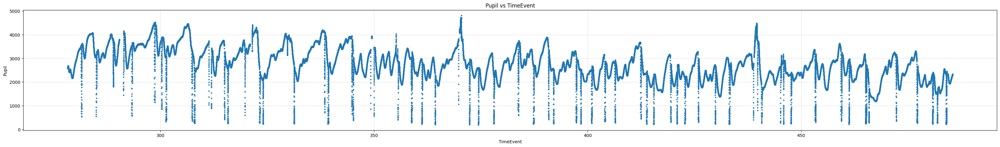

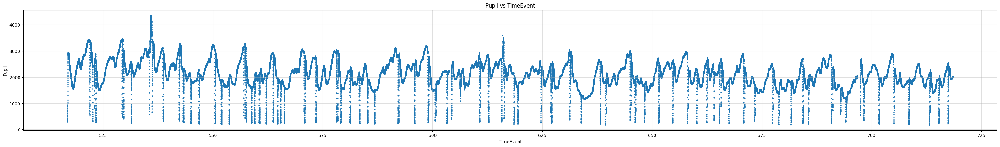

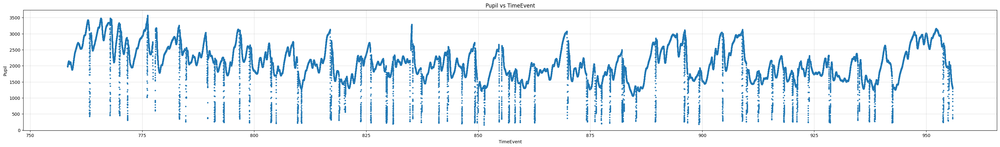

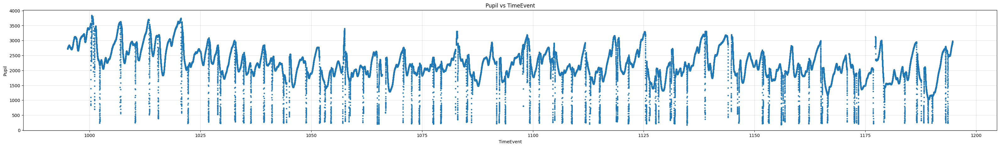

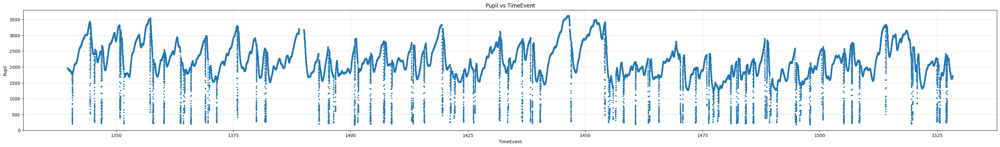

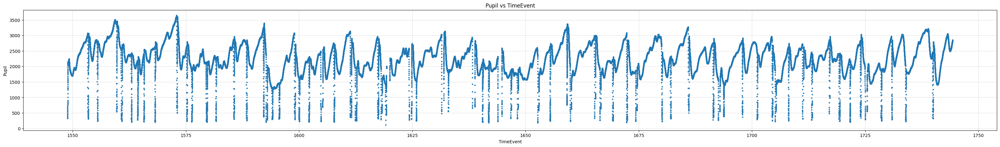

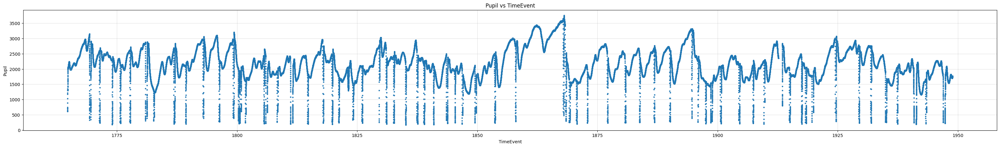

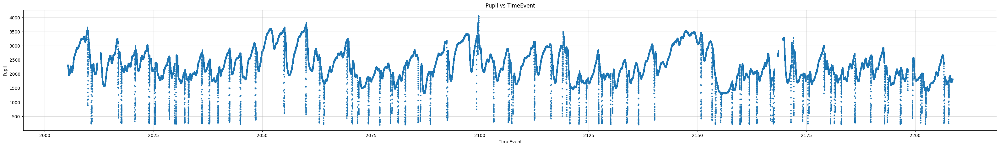

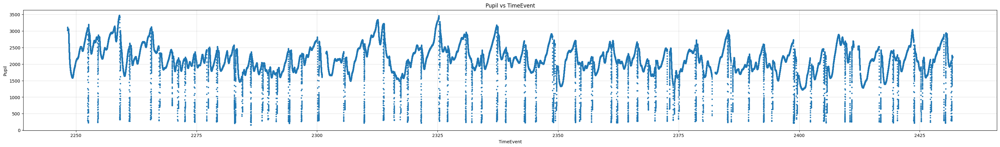

In [70]:


first_trials = test.log_data[test.log_data['trial_index_within_block'] == 1]

# extract and floor
block_starts = first_trials['events'].apply(lambda ev: math.floor(ev[0]['time']))
block_starts = block_starts.sort_values().tolist()
block_starts.append(test.eye_raw['TimeEvent'].max()+1)  # sentinel

for i in range(len(block_starts)-1):
    start = block_starts[i]
    end   = block_starts[i+1]

    block_df = test.eye_raw[(test.eye_raw['TimeEvent'] >= start) & (test.eye_raw['TimeEvent'] < end)]
    block_df = block_df.dropna(subset=['Pupil','TimeEvent'])


    plt.figure(figsize=(40,5))
    plt.scatter(block_df['TimeEvent'], block_df['Pupil'], s=5)  # s controls dot size
    plt.xlabel("TimeEvent")
    plt.ylabel("Pupil")
    plt.title("Pupil vs TimeEvent")
    plt.grid(True, alpha=0.4)
    plt.show()

In [42]:
test.eye_raw['TimeEvent'][:30]

0     278.242228
1     278.242414
2     278.247414
3     278.248414
4     278.249414
5     278.250414
6     278.251414
7     278.252414
8     278.253414
9     278.254414
10    278.255414
11    278.256414
12    278.257414
13    278.258414
14    278.259414
15    278.260414
16    278.261414
17    278.262414
18    278.263414
19    278.264414
20    278.265414
21    278.266414
22    278.267414
23    278.268414
24    278.269414
25    278.270414
26    278.271414
27    278.272414
28    278.273414
29    278.274414
Name: TimeEvent, dtype: float64

In [43]:
test.eye_raw['Pupil'][:30]  

0        NaN
1        NaN
2     2584.0
3     2585.0
4     2588.0
5     2591.0
6     2589.0
7     2584.0
8     2583.0
9     2588.0
10    2593.0
11    2594.0
12    2594.0
13    2596.0
14    2598.0
15    2599.0
16    2599.0
17    2599.0
18    2599.0
19    2600.0
20    2600.0
21    2602.0
22    2603.0
23    2606.0
24    2609.0
25    2611.0
26    2613.0
27    2613.0
28    2614.0
29    2613.0
Name: Pupil, dtype: float64